In [1]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2' 
from tqdm import tqdm
import requests
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras as tfk
from tensorflow.keras import backend as K
import cv2
import sys
import seaborn as sns
import pandas as pd
import json


np.random.seed(1)

Checking if Tensorflow detected our GPU

In [2]:
tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [3]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [4]:
sys.path.append("/content/gdrive/MyDrive/Proactive ware/")

In [5]:
from utils.utils import *

**Side Note**

In this notebook, I didn't show the implementation of functions i wrote, instead I focused on the approach I took to solve the problem.

If you want to see the implementation of functions, you can find them in folder named `utils`.

# 0-Extracting Data

We use the dataset gathered in here:

https://www.nature.com/articles/s41597-023-01951-4

In [6]:
# filenames = ["train.zip"]
# urls = ["https://zenodo.org/record/7358126/files/bdappv.zip?download=1",]

# for fname, url in zip(filenames, urls):
#     if not os.path.isfile(fname):
#         try:
#             r = requests.get(url, stream = True)
#         except requests.ConnectionError:
#             print("Failed to download data !!!")
#         else:
#             if r.status_code != requests.codes.ok:
#                 print("Failed to download data !!!")
#             else:
#                 with open("./" + fname, "wb") as fid:
#                     for block in r.iter_content(chunk_size = 1024):
#                         if block: 
#                             fid.write(block) 

In [7]:
!cp /content/gdrive/MyDrive/"Proactive ware"/train.zip -d .

In [8]:
!unzip ./train.zip -d ./data

Streaming output truncated to the last 5000 lines.
  inflating: ./data/bdappv/ign/mask/JBWSM2376YTTKN.png  
  inflating: ./data/bdappv/ign/mask/JBWYB646ASRXSP.png  
  inflating: ./data/bdappv/ign/mask/JBYPO579AQTCRR.png  
  inflating: ./data/bdappv/ign/mask/JCCHE3B3AQMDHW.png  
  inflating: ./data/bdappv/ign/mask/JCDXN68A5AEKSM.png  
  inflating: ./data/bdappv/ign/mask/JCFJA4104QVWPG.png  
  inflating: ./data/bdappv/ign/mask/JCFXI19CFYTPRX.png  
  inflating: ./data/bdappv/ign/mask/JCIWV8B26MYFFY.png  
  inflating: ./data/bdappv/ign/mask/JCJQG8729LFVCL.png  
  inflating: ./data/bdappv/ign/mask/JCJVH7425QKICU.png  
  inflating: ./data/bdappv/ign/mask/JCLEL236SPSBI.png  
  inflating: ./data/bdappv/ign/mask/JCMOV2CA3LIRNA.png  
  inflating: ./data/bdappv/ign/mask/JCMSG1CF8ACCNH.png  
  inflating: ./data/bdappv/ign/mask/JCNRO4E9FDMWFX.png  
  inflating: ./data/bdappv/ign/mask/JCRRD7941SUHSX.png  
  inflating: ./data/bdappv/ign/mask/JCUSO649DSXJFM.png  
  inflating: ./data/bdappv/ign/mask/JC

# 1 - EDA

we can see how many images and mask we have

In [41]:
input_dirs = [
    "./data/bdappv/google/img",
    "./data/bdappv/ign/img"
    ]
target_dirs = [
    "./data/bdappv/google/mask",
    "./data/bdappv/ign/mask"
    ]


img_paths, mask_paths = read_data_path(input_dirs, target_dirs)
len(img_paths), len(mask_paths)

100%|██████████| 7685/7685 [00:00<00:00, 637058.05it/s]


(46132, 20988)

Let's see some images from our dataset:

(`show_images_in_row` is a helper function for showing images.)

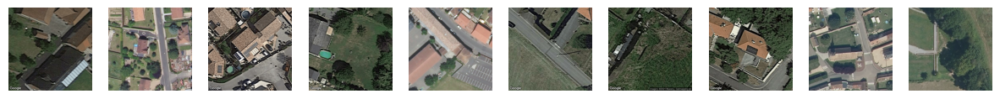

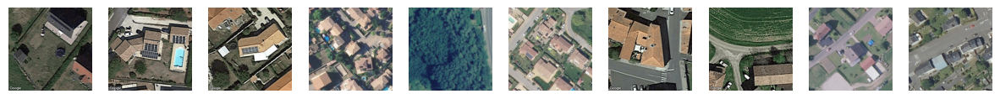

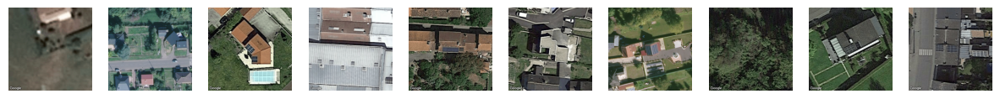

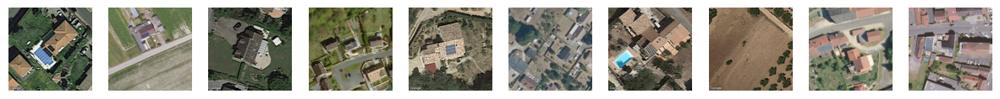

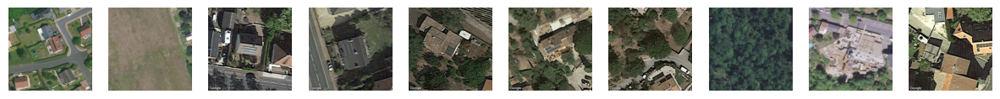

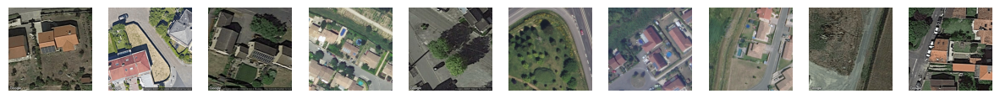

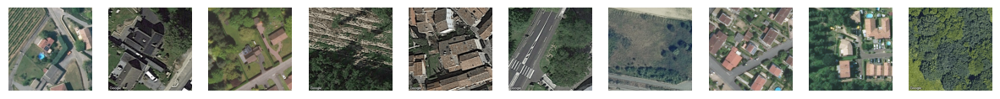

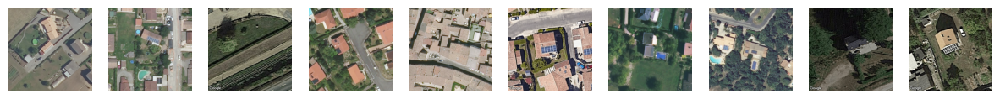

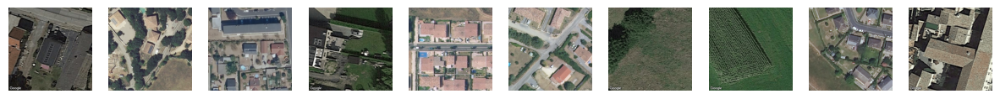

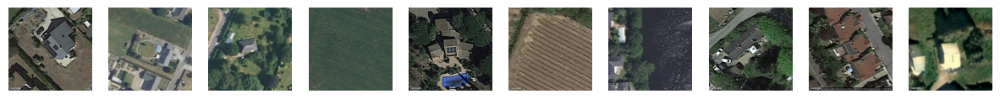

In [42]:
paths_visualized = []
for i in range(10):
    paths = np.random.choice(img_paths, 10)
    paths_visualized.append(paths)
    images = [read_image_from_path(path) for path in paths]
    show_images_in_row(images)

It looks like we have some images that are somehow missing values. 

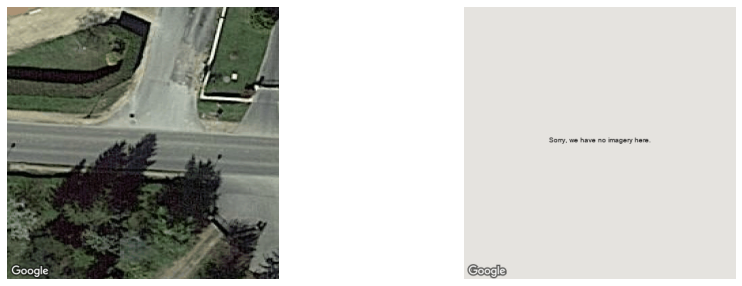

In [ ]:
path = paths_visualized[3][-2] 
# the random image generated in pc and colab are different despite using seed
_path = "./data/bdappv/google/img/ZACSK5A4ABXMJS.png"
show_images_in_row([read_image_from_path(path), read_image_from_path(_path)])

In [ ]:
try:
    _mask_path = _path.replace("/img/", "/mask/")
    show_images_in_row([read_image_from_path(_mask_path)])
except:
    print("Not Found")

Not Found


There is no mask image for the corrupted image we just found, let's filter out the images that don't have any masks. **(Later we will see that it's a mistake!)**

In [43]:
_img_paths = set(img_paths)
_mask_paths = set(mask_paths)

img_no_mask = []
mask_no_img = []
for img_path in img_paths:
    _mask_path = img_path.replace("/img/", "/mask/")
    if _mask_path not in _mask_paths:
        img_no_mask.append(img_path)
        
for mask_path in mask_paths:
    _img_path = mask_path.replace("/mask/", "/img/")
    if _img_path not in _img_paths:
        mask_no_img.append(mask_path)
        
print(len(img_no_mask), len(mask_no_img))

available_img_paths, available_mask_paths = find_images_with_mask(
    img_paths, 
    mask_paths
)
available_img_paths.sort()
available_mask_paths.sort()

25144 0


There were 25144 images that had no matching masks. So we filtered them out.

Next, We want to know what is the shape of the images in our dataset:

**Note**: we sample from the dataset and check the samples shapes instead of checking the shape for the whole dataset.

In [ ]:
# sampling from the images, not using the whole dataset
shapes = []
for path in tqdm(img_paths[::100]):
    img = read_image_from_path(path)
    shapes.append((img.shape, path.split("/")[-3]))
set(shapes)

100%|██████████| 462/462 [00:08<00:00, 53.63it/s]


{(TensorShape([400, 400, 3]), 'google'), (TensorShape([400, 400, 3]), 'ign')}

We can be quite sure that every image we have, has the size of (400, 400) and has 3 channels.

Now let's check the distribution of the label dataset.

We want to know how many panels can be found in each image, and how big they are in the image. So we do the following:

In [ ]:
# sampling from the images, not using the whole dataset
size_mean = []
num_panels = []
for path in tqdm(mask_paths[::50]):
    img = read_image_from_path(path)
    pixs_1 = np.sum(img != 0)
    num_panel = np.max(get_masks_unet(img))
    size_mean.append(pixs_1/num_panel)
    num_panels.append(num_panel)

100%|██████████| 420/420 [00:09<00:00, 42.34it/s]


<Axes: ylabel='Density'>

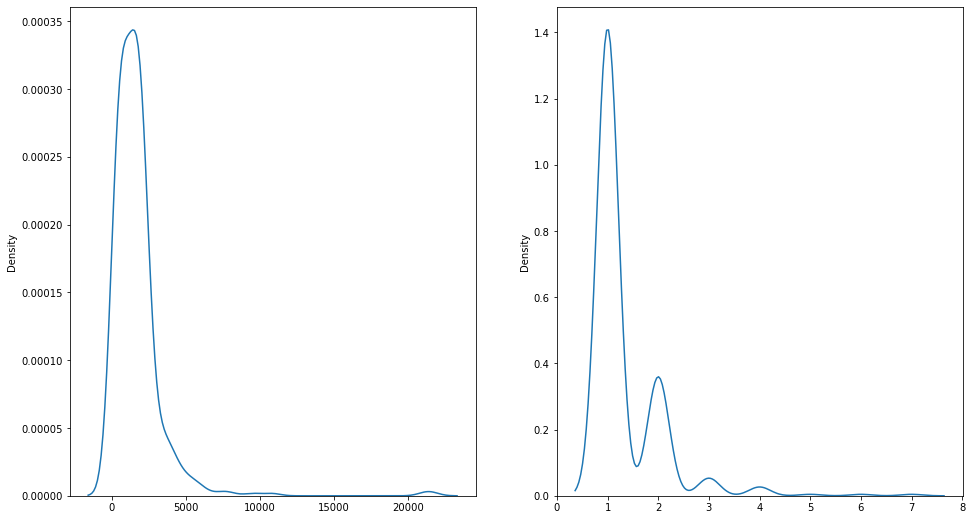

In [ ]:
fig, ax =plt.subplots(1,2, figsize=(16, 9))

sns.kdeplot(
    size_mean,
#     bw_adjust=0.7,
    ax=ax[0]
)

sns.kdeplot(
    num_panels,
#     bw_adjust=0.7,
    ax=ax[1]
)

Now we realize some important things:

* The panels in each photo are no bigger than 3% of the whole image in most of the times, so the quality of our images must be preserved and if we downsample our images in preprocessing procedure, we will lose important datas.

* Most of the times, There are few panels in each photos.

* **And the most important thing is that there is no label image that is fully blank. If we want to have images of scenes without panels in our training dataset, we shouldn't filter out images without masks.**


Then we would have to keep images without masks in our dataset, despite of Knowing the fact that there might be corrupted images, and Worse, we might have images with panels but they will be considered as images with no panels in them. And if we don't keep them in our dataset, then our model might learn that it has to find a panel in every image.

In [44]:
len(img_no_mask), len(available_img_paths)

(25144, 20988)

The lengths are approximately equal, so we consider this dataset as balanced.

Let's Visualise some photos, annoting the panels in them by using their masks. 

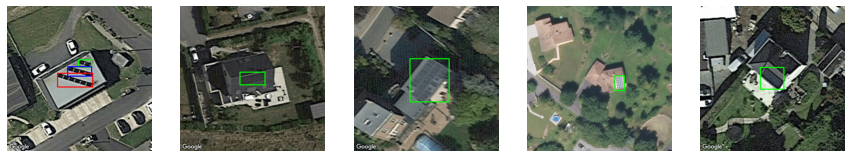

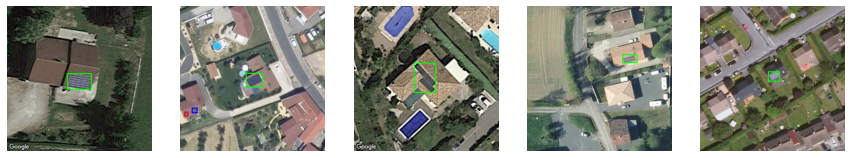

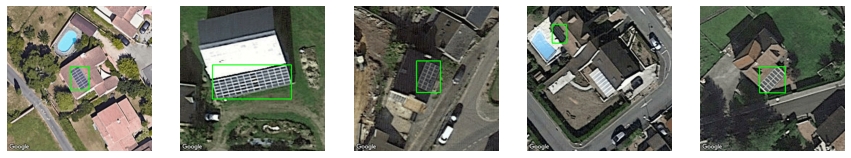

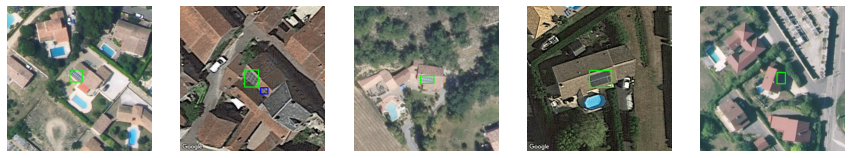

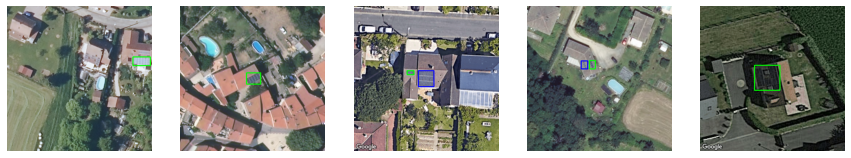

In [ ]:
for i in range(5):
    idxs = np.random.randint(0, len(available_img_paths), 5)
    images = [read_image_from_path(available_img_paths[idx]) for idx in idxs]
    masks = [read_image_from_path(available_mask_paths[idx]) for idx in idxs]
    masks = [get_masks_unet(masks[idx], 0) for idx in range(len(masks))]
    detected = [draw_box_all(images[idx], masks[idx]) for idx in range(len(masks))]
    show_images_in_row(detected)

# 2 - Data Preparation

## Seperating our data to Train/Validation/Test datasets

We use train_test_split function from scikit-learn module to seperate our dataset into 3 datasets.

Train: 60% - validation: 20% - test: 20%

In [45]:
from sklearn.model_selection import train_test_split

# train: 60% - validation: 20% - test: 20%

X_train_with_mask, X_test_with_mask, y_train_with_mask, y_test_with_mask = train_test_split(
    available_img_paths, 
    available_mask_paths, 
    test_size=0.2, 
    random_state=1
    )
# 0.25 * 0.8 = 0.2
X_train_with_mask, X_val_with_mask, y_train_with_mask, y_val_with_mask = train_test_split(
    X_train_with_mask, 
    y_train_with_mask, 
    test_size=0.25, 
    random_state=1)


Now the images with no masks data sets:

In [46]:
X_train_no_mask, X_test_no_mask = train_test_split(
    img_no_mask, 
    test_size=0.2, 
    random_state=1
    )

# 0.25 * 0.8 = 0.2
X_train_no_mask, X_val_no_mask = train_test_split(
    X_train_no_mask, 
    test_size=0.25, 
    random_state=1)

Then we add artificial mask paths for images that have no label into our dataset:

In [ ]:
X_train = X_train_no_mask + X_train_with_mask
# we add X_train_no_mask while they are not mask photos
y_train = X_train_no_mask + y_train_with_mask 

X_val = X_val_no_mask + X_val_with_mask
y_val = X_val_no_mask + y_val_with_mask

X_test = X_test_no_mask + X_test_with_mask
y_test = X_test_no_mask + y_test_with_mask

We save these paths to a json file so we wouldn't have to extract them again in the other notebook.

In [ ]:
# datasets = {
#     "X_train": X_train,
#     "y_train": y_train,

#     "X_val": X_val,
#     "y_val" : y_val,

#     "X_test" : X_test,
#     "y_test" : y_test,
# }

# with open("datasets.json", "w") as outfile:
#     json.dump(datasets, outfile)

To load dataset we use:

In [10]:
with open('/content/gdrive/MyDrive/Proactive ware/datasets.json', 'r') as openfile:
    # Reading from json file
    datasets = json.load(openfile)

X_train = datasets["X_train"]
y_train = datasets["y_train"]

X_val = datasets["X_val"]
y_val = datasets["y_val"]

X_test = datasets["X_test"]
y_test = datasets["y_test"]

## Create Dataloaders

We have a huge dataset, So we can't simply load all images and their masks into our memory by saving them in numpy.arrays (or tf.tensors).

We need to create a python generator that will load our data, as these generators load data batch-by-batch.

The function below creates a `tf._ZipDataset` that contains pairs of images and masks. We will later transform these generators into more useful genrators.

**For paths that has no mask, we generate their masks using zero arrays.**

`create_raw_data_loader` also shuffles the datasets.

In [11]:
ds_train_raw = create_raw_data_loader(X_train, y_train)
ds_val = create_raw_data_loader(X_val, y_val)

Let's see how data loaders work:

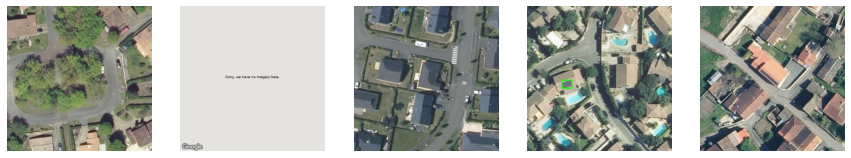

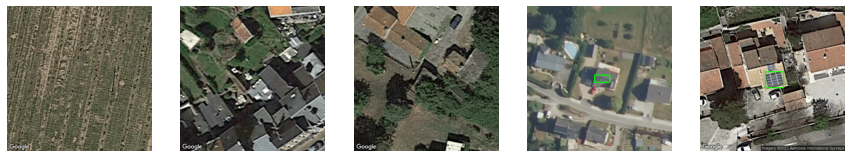

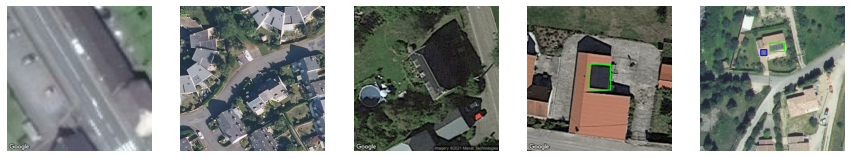

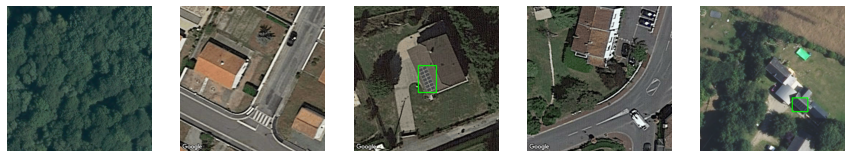

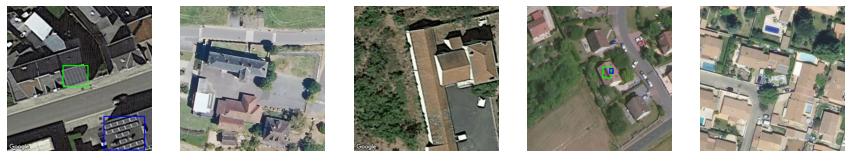

In [ ]:
it = iter(ds_val)
for i in range(5):
    imm_masks = [next(it) for _ in range(5)]
    images = []
    masks = []
    for j in range(5):
        images.append(imm_masks[j][0])
        masks.append(imm_masks[j][1])
    masks = [get_masks_unet(masks[idx], 0) for idx in range(len(masks))]
    detected = [draw_box_all(images[idx], masks[idx]) for idx in range(len(masks))]
    show_images_in_row(detected)

Actually we can use these generators to load an (image, mask) pair. By calling iter function with atf.data.dataset obj as its input argument (or calling `.__iter__()` method on the obj), we will have an iterator that we can use them to load our data by iterating on them by using for loops.(or we can call `.__next__()` method on this obj to have the next output)

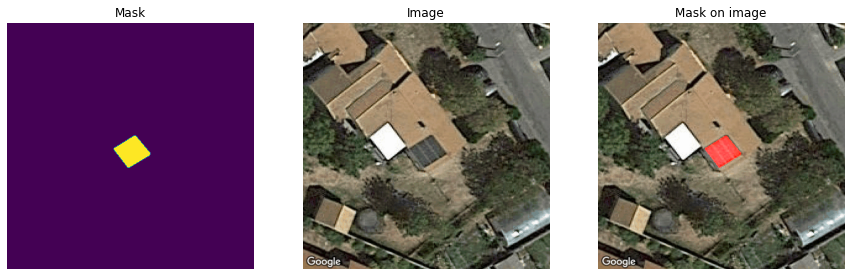

In [ ]:
image, mask = next(iter(ds_train_raw))

highlighted = highlight_mask_on_image(image, mask)

titles = ["Mask", "Image", "Mask on image"]
show_images_in_row([mask, image, highlighted], titles)

We define the `normalize_resize` function to transform our input images to a standard format.

Now we want to define a function so we could augment our training set and w name it `augment`. why?

Data augmentation is a technique used to artificially increase the size and diversity of a dataset. This is done by applying transformations to the existing data points, such as flipping, rotating, and cropping. 

There are several reasons why data augmentation is useful for computer vision tasks. First, it can help to reduce overfitting. Overfitting occurs when a model learns the training data too well and is unable to generalize to new data. Data augmentation can help to prevent overfitting by providing the model with more data to learn from.

Second, data augmentation can help to improve the accuracy of a model. By applying transformations to the data, the model is forced to learn to recognize objects in a variety of conditions. This can make the model more robust to changes in lighting, pose, and other factors.

Third, data augmentation can help to speed up the training process. By providing the model with more data, the training process can be completed more quickly.

There are a variety of data augmentation techniques that can be used for computer vision tasks. Some of the most common techniques include:

* Flipping
* Cropping
* Brightness
* Contrast
* Saturation

I didn't use random rotation, as i thought the data itself has no bias toward the shooting angle.

Now we apply the preprocessing function we defined to our dataloaders using function `tf_dataset`.

We define a function to apply the functions we just defined to our dataloaders, and we specify a batch size for the generator.

**We also use `.repeat` so our generators have an infinte length, I will explain later why.**

In [18]:
IMG_SIZE = 372
input_shape = (IMG_SIZE, IMG_SIZE, 3)
batch_size = 4

In [19]:
ds_train = tf_dataset(ds_train_raw, batch_size=batch_size, train=True)
ds_val = tf_dataset(ds_val, batch_size=batch_size, train=False)

Let's see an example:

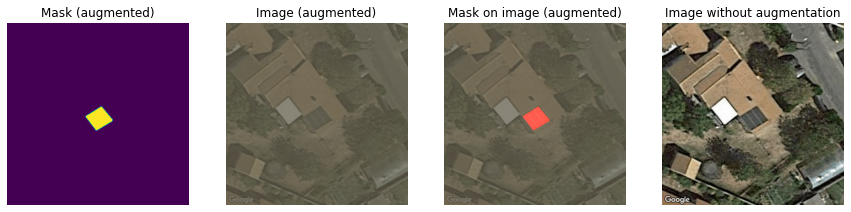

In [ ]:
image_raw, _ = next(iter(ds_train_raw))
image, mask = next(iter(ds_train))

highlighted = highlight_mask_on_image(image[0], mask[0])

titles = ["Mask (augmented)", "Image (augmented)", "Mask on image (augmented)", "Image without augmentation"]
show_images_in_row([mask[0], image[0], highlighted, image_raw], titles)

# 3 - Model Training

## Defining The Model

The model architecture I am going to use for this segmentation task is `U-Net`. It looks like this:

![U-Net Architecture](https://www.frontiersin.org/files/Articles/841297/fnagi-14-841297-HTML-r2/image_m/fnagi-14-841297-g001.jpg)

`U-Net` is a convolutional neural network architecture that is commonly used for image segmentation. It is a fully convolutional network, which means that it can be used to segment images of any size. `U-Net` consists of two main parts: a contracting path(Encoder) and an expansive path(Decoder). The contracting path is responsible for extracting features from the input image, while the expansive path is responsible for upsampling the features and generating the segmentation mask.


Here are some of the advantages of using `U-Net`:

* It is a fully convolutional network, which means that it can be used to segment images of any size.
* It has been shown to be effective for a variety of image segmentation tasks.
* It is relatively easy to train.

Here are some of the disadvantages of using `U-Net`:

* It can be computationally expensive to train.
* It can be difficult to tune the hyperparameters of `U-Net`.
* U-Net can be sensitive to noise in the input image.



**`U-Net` is a computationally expensive model to train.** We can use **Transfer Learning** to reduce the training time and cost. To do this, we can use the pre-trained weights of the `VGG16` model for the encoder part of our network.

Here is a brief explanation:

Transfer learning is a machine learning technique where a model trained on one task is reused as the starting point for a model on a second task. This can be done by using the pre-trained weights of the first model as the starting point for the second model. This can help to improve the performance of the second model, especially if the two tasks are related.

In our case, we can use the pre-trained weights of the `VGG16` model for the encoder part of our `U-Net` model(and we will freeze them). This will help to improve the performance of our `U-Net` model, especially since the `VGG16` model has been trained on a large dataset of images, `imagenet`, which means that it has already learned to recognize a wide variety of objects.

Now Let's load a `VGG16` model and see how it looks like.

In [ ]:
from keras.models import Model,load_model
from keras.applications import vgg16

from keras.callbacks import EarlyStopping, ModelCheckpoint


VGG16 = vgg16.VGG16(include_top=False, weights="imagenet", input_shape=input_shape)

vgg_model = Model(VGG16.input, VGG16.output)
vgg_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 372, 372, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 372, 372, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 372, 372, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 186, 186, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 186, 186, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 186, 186, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 93, 93, 128)       0     

Now we Define a function that creates a `U-Net` model using `VGG16` pretrained weights.

We define a model and compile it with `Adam` optimizer and `binary_crossentropy` loss as our model is going to detect a single class for each pixel.

In [13]:
unet_model = unet_model_creator(weights="imagenet")
unet_model.compile(
    optimizer = Adam(learning_rate = 1e-4), 
    loss = 'binary_crossentropy', 
    metrics = ['accuracy']
)

Let's see how are model looks like:

In [ ]:
unet_model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 372, 372, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 372, 372, 64  1792        ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv2 (Conv2D)          (None, 372, 372, 64  36928       ['block1_conv1[0][0]']           
                                )                                                           

 leaky_re_lu_4 (LeakyReLU)      (None, 46, 46, 512)  0           ['conv2d_transpose_1[0][0]']     
                                                                                                  
 concatenate_1 (Concatenate)    (None, 46, 46, 1024  0           ['leaky_re_lu_4[0][0]',          
                                )                                 'block4_conv3[0][0]']           
                                                                                                  
 conv2d_2 (Conv2D)              (None, 46, 46, 512)  4719104     ['concatenate_1[0][0]']          
                                                                                                  
 batch_normalization_3 (BatchNo  (None, 46, 46, 512)  2048       ['conv2d_2[0][0]']               
 rmalization)                                                                                     
                                                                                                  
 leaky_re_

 spose)                         8)                                                                
                                                                                                  
 leaky_re_lu_13 (LeakyReLU)     (None, 372, 372, 12  0           ['conv2d_transpose_4[0][0]']     
                                8)                                                                
                                                                                                  
 concatenate_4 (Concatenate)    (None, 372, 372, 19  0           ['leaky_re_lu_13[0][0]',         
                                2)                                'block1_conv2[0][0]']           
                                                                                                  
 conv2d_8 (Conv2D)              (None, 372, 372, 64  110656      ['concatenate_4[0][0]']          
                                )                                                                 
          

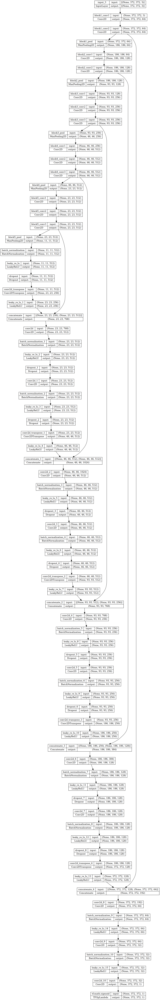

In [ ]:
from keras.utils.vis_utils import plot_model

plot_model(unet_model,show_shapes=True, show_layer_names=True)

## Training The Model

We define a function that will return a trained `U-Net` model, either by training it or by loading a pre-trained one. It's called `fine_tune`.

Now it's time to explain why we used `.repeat()` on our data generators.

So far we know that we have a big dataset, big for me and my computer :)

Instead of training data normally, I made the dataloader's length infinite, and told the `model.fit` that it has a length of 0.10 the actual length. This is not recommended, but I had to do this because of the reasons below:

* Each epoch would take so long to finish.
* With such big datasets, the model might learn the proper weights on the early epochs.
* The above would make callbacks such as `EarlyStopping` and `ReduceLROnPlateau` useless.

By defining `steps_per_epoch` in this way, each 10 epochs will be considered as a single standard epoch.

In [ ]:
# To train
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

epochs = 50

train_steps = len(X_train)//(10*batch_size)
valid_steps = len(X_val)//(10*batch_size)


early_stopping = EarlyStopping(patience=6, verbose=1)
model_checkpoint = ModelCheckpoint("./solar_new", save_best_only=True, monitor="val_loss")
reduce_lr = ReduceLROnPlateau(factor=0.1, patience=3, min_lr=0.00001, verbose=1)
kwargs = {
    "x":ds_train,
    "validation_data":ds_val,
    "epochs":epochs,
    "steps_per_epoch":train_steps,
    "validation_steps":valid_steps,
    "batch_size":batch_size,
    "validation_batch_size":batch_size,
    "callbacks":[
        early_stopping, 
        model_checkpoint, 
        reduce_lr
    ],
}


# unet_model, history = fine_tune(
#     unet_model,
#     train=True,
#     history_path='history.pickle',
#     **kwargs
# )

Epoch 1/50
691/691 [==============================] - ETA: 0s - loss: 0.0979 - accuracy: 0.9941

691/691 [==============================] - 566s 819ms/step - loss: 0.0979 - accuracy: 0.9941 - val_loss: 0.0636 - val_accuracy: 0.9829 - lr: 1.0000e-04
Epoch 2/50
691/691 [==============================] - ETA: 0s - loss: 0.0216 - accuracy: 0.9954

691/691 [==============================] - 566s 818ms/step - loss: 0.0216 - accuracy: 0.9954 - val_loss: 0.0181 - val_accuracy: 0.9955 - lr: 1.0000e-04
Epoch 3/50
691/691 [==============================] - ETA: 0s - loss: 0.0176 - accuracy: 0.9949

691/691 [==============================] - 565s 818ms/step - loss: 0.0176 - accuracy: 0.9949 - val_loss: 0.0140 - val_accuracy: 0.9959 - lr: 1.0000e-04
Epoch 4/50
691/691 [==============================] - 556s 804ms/step - loss: 0.0156 - accuracy: 0.9949 - val_loss: 0.0156 - val_accuracy: 0.9954 - lr: 1.0000e-04
Epoch 5/50
691/691 [==============================] - ETA: 0s - loss: 0.0126 - accuracy: 0.9955

691/691 [==============================] - 567s 820ms/step - loss: 0.0126 - accuracy: 0.9955 - val_loss: 0.0127 - val_accuracy: 0.9958 - lr: 1.0000e-04
Epoch 6/50
691/691 [==============================] - ETA: 0s - loss: 0.0124 - accuracy: 0.9957

691/691 [==============================] - 565s 818ms/step - loss: 0.0124 - accuracy: 0.9957 - val_loss: 0.0125 - val_accuracy: 0.9956 - lr: 1.0000e-04
Epoch 7/50
691/691 [==============================] - ETA: 0s - loss: 0.0122 - accuracy: 0.9955

691/691 [==============================] - 564s 816ms/step - loss: 0.0122 - accuracy: 0.9955 - val_loss: 0.0115 - val_accuracy: 0.9961 - lr: 1.0000e-04
Epoch 8/50
691/691 [==============================] - 573s 829ms/step - loss: 0.0123 - accuracy: 0.9954 - val_loss: 0.0174 - val_accuracy: 0.9947 - lr: 1.0000e-04
Epoch 9/50
691/691 [==============================] - 551s 798ms/step - loss: 0.0106 - accuracy: 0.9958 - val_loss: 0.0157 - val_accuracy: 0.9950 - lr: 1.0000e-04
Epoch 10/50
691/691 [==============================] - ETA: 0s - loss: 0.0107 - accuracy: 0.9959

691/691 [==============================] - 565s 818ms/step - loss: 0.0107 - accuracy: 0.9959 - val_loss: 0.0114 - val_accuracy: 0.9961 - lr: 1.0000e-04
Epoch 11/50
691/691 [==============================] - 563s 814ms/step - loss: 0.0117 - accuracy: 0.9955 - val_loss: 0.0131 - val_accuracy: 0.9954 - lr: 1.0000e-04
Epoch 12/50
691/691 [==============================] - ETA: 0s - loss: 0.0096 - accuracy: 0.9963

691/691 [==============================] - 568s 822ms/step - loss: 0.0096 - accuracy: 0.9963 - val_loss: 0.0104 - val_accuracy: 0.9964 - lr: 1.0000e-04
Epoch 13/50
691/691 [==============================] - ETA: 0s - loss: 0.0122 - accuracy: 0.9956

691/691 [==============================] - 570s 824ms/step - loss: 0.0122 - accuracy: 0.9956 - val_loss: 0.0097 - val_accuracy: 0.9965 - lr: 1.0000e-04
Epoch 14/50
691/691 [==============================] - 577s 836ms/step - loss: 0.0113 - accuracy: 0.9957 - val_loss: 0.0107 - val_accuracy: 0.9965 - lr: 1.0000e-04
Epoch 15/50
691/691 [==============================] - 558s 808ms/step - loss: 0.0099 - accuracy: 0.9960 - val_loss: 0.0104 - val_accuracy: 0.9964 - lr: 1.0000e-04
Epoch 16/50
691/691 [==============================] - ETA: 0s - loss: 0.0101 - accuracy: 0.9961
Epoch 16: ReduceLROnPlateau reducing learning rate to 1e-05.
691/691 [==============================] - 577s 836ms/step - loss: 0.0101 - accuracy: 0.9961 - val_loss: 0.0099 - val_accuracy: 0.9965 - lr: 1.0000e-04
Epoch 17/50
691/691 [==============================] - ETA: 0s - loss: 0.0093 - accuracy: 0.9963

691/691 [==============================] - 572s 828ms/step - loss: 0.0093 - accuracy: 0.9963 - val_loss: 0.0092 - val_accuracy: 0.9966 - lr: 1.0000e-05
Epoch 18/50
691/691 [==============================] - ETA: 0s - loss: 0.0094 - accuracy: 0.9962

691/691 [==============================] - 568s 823ms/step - loss: 0.0094 - accuracy: 0.9962 - val_loss: 0.0092 - val_accuracy: 0.9966 - lr: 1.0000e-05
Epoch 19/50
691/691 [==============================] - ETA: 0s - loss: 0.0082 - accuracy: 0.9965

691/691 [==============================] - 588s 850ms/step - loss: 0.0082 - accuracy: 0.9965 - val_loss: 0.0091 - val_accuracy: 0.9966 - lr: 1.0000e-05
Epoch 20/50
691/691 [==============================] - 558s 807ms/step - loss: 0.0089 - accuracy: 0.9963 - val_loss: 0.0094 - val_accuracy: 0.9966 - lr: 1.0000e-05
Epoch 21/50
691/691 [==============================] - 576s 834ms/step - loss: 0.0088 - accuracy: 0.9962 - val_loss: 0.0092 - val_accuracy: 0.9967 - lr: 1.0000e-05
Epoch 22/50
691/691 [==============================] - 558s 808ms/step - loss: 0.0079 - accuracy: 0.9967 - val_loss: 0.0093 - val_accuracy: 0.9966 - lr: 1.0000e-05
Epoch 23/50
691/691 [==============================] - 558s 807ms/step - loss: 0.0092 - accuracy: 0.9963 - val_loss: 0.0092 - val_accuracy: 0.9966 - lr: 1.0000e-05
Epoch 24/50
691/691 [==============================] - 558s 808ms/step - loss: 0.0088 - accuracy: 0.9963 - val_loss: 0.0096 - val_accuracy: 0.9966 - lr: 1.0000e-05
Epoch 25/50
691/691 [=======

Saving results to drive:

In [ ]:
# !cp -r ./solar_new -d /content/gdrive/MyDrive/"Proactive ware"/solar_new

In [ ]:
# !cp ./history.pickle -d /content/gdrive/MyDrive/"Proactive ware"/

To Download weights of the trained model use the cells below:

In [ ]:
# !gdown --id 1gd7UFG76JJq_VUcApHMUFRRpjKlQM6l1

In [ ]:
# !unzip ./solar_new -d ./solar_model

**To load the trained model use this cell**

In [14]:
# To load
unet_model, history = fine_tune(
    unet_model,
    train=False,
    checkpoint_path="/content/gdrive/MyDrive/Proactive ware/solar_new",
    history_path='/content/gdrive/MyDrive/Proactive ware/history.pickle',
)

Let's see the loss and accuracy of model per each epoch.

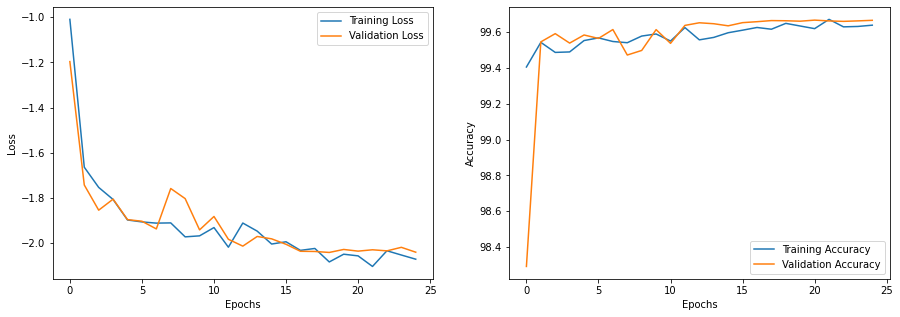

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))
axs[0].plot(np.log10(history["loss"]), label="Training Loss")
axs[0].plot(np.log10(history["val_loss"]), label="Validation Loss")
axs[0].set_ylabel("Loss")
axs[0].set_xlabel("Epochs")
axs[0].legend()

axs[1].plot(np.array(history["accuracy"])*100, label="Training Accuracy")
axs[1].plot(np.array(history["val_accuracy"])*100, label="Validation Accuracy")
axs[1].set_ylabel("Accuracy")
axs[1].set_xlabel("Epochs")
axs[1].legend()

plt.show()

As we can see, the learning procedure stopped at the end of the 24th epoch, which means that our model barely took 3 standard epochs to be trained.

At the end, as we can see the training loss and validation loss are very close to each other, which means that our model is not overfitting. So if the model results are not satisfying, we should increase the complexity of our model and train the new model, which was not possible for me.

The accuracy is also plotted but it's not the best metric to evaluate our model, now we try to evaluate the performance of our model in a better way.

# 4 - Hyper-Parameter Tuning and Evaluation Procedure on Test set

We define some new set of functions that will help us to:
* create a bool (actually integer) mask from the output of our model. Because the output of our model is vague, and each pixel value can be regarded as a probability of that pixel being true. It also improve the quality of the predicted mask by removing small masks and holes. It's called `fill_holes_and_remove_small_masks`.

* Calculating `IOU` metric for each mask and predicted mask, which is a commonly used metric for segmentation tasks. It's called `_intersection_over_union`. 

* Calculating true_positive, false_positive and fasle_negative of our predicted masks. **By True_Positive we mean that the number of panels our model detected successfully (has IOU > 0.5 with the ground_truth panel in mask).** A similar definition goes for False_Positive and False_Negative. This function is named `average_precision`.

* Separating each panel in masks by giving them different pixel values. It's done by the function we previously used, `get_masks_unet`. 

There is an important hyper-parameter called `threshold`. We must assign a class to each pixel, either 1 or 0 (Panel or Not). The way it's done is that we check if a pixel of the output of our model is greater than a threshold or not.

To put it simply:

pixel class = {

    1: if value > threshold
    
    0: Otherwise
    
}

We will have to tune this hyper-parameter and then evaluate our models performance. Let's see how this threshold affects the output:

1/1 [==============================] - 18s 18s/step
threshold is: 0.7
threshold is: 0.2


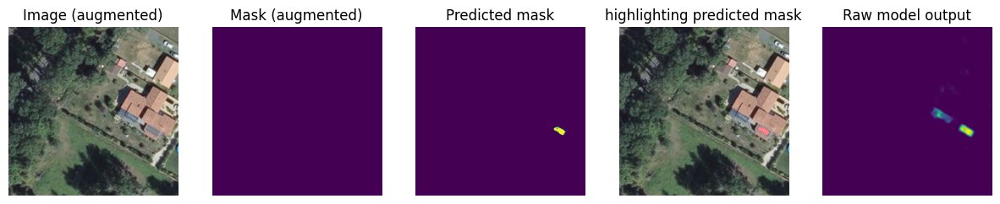

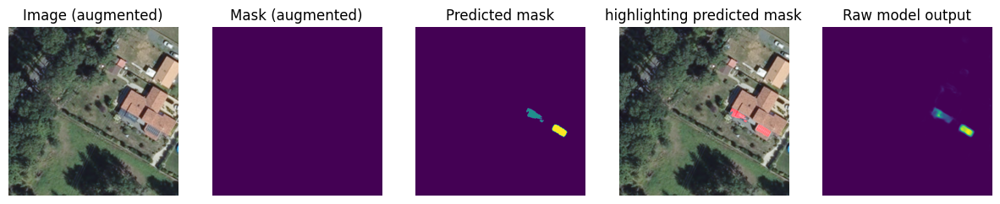

In [20]:
image, mask = next(iter(ds_val))
predicted = unet_model.predict(image)
i = 0


threshold = 0.7
print(f"threshold is: {threshold}")
predicted_mask = fill_holes_and_remove_small_masks(predicted[i], threshold=threshold)
predicted_mask_colored = get_masks_unet(predicted[i], threshold=threshold)
titles = ["Image (augmented)", "Mask (augmented)", "Predicted mask", "highlighting predicted mask", "Raw model output"]
hg = highlight_mask_on_image(image[i], predicted_mask)
show_images_in_row([image[i], mask[i], predicted_mask_colored, hg, predicted[i]], titles)

threshold = 0.2
print(f"threshold is: {threshold}")
predicted_mask = fill_holes_and_remove_small_masks(predicted[i], threshold=threshold)
predicted_mask_colored = get_masks_unet(predicted[i], threshold=threshold)
titles = ["Image (augmented)", "Mask (augmented)", "Predicted mask", "highlighting predicted mask", "Raw model output"]
hg = highlight_mask_on_image(image[i], predicted_mask)
show_images_in_row([image[i], mask[i], predicted_mask_colored, hg, predicted[i]], titles)

We alsodefined a function called `calc_precision` to calculate some scores:

The output will be:
* average custom precision estimation: AP = TP / (TP + FP + FN)
* [avg_TP, avg_FP, avg_FN]

The custom precision penalizes FP and FN equally. We will use this to pick the best threshold(This Tuning will be done in validation set and the evaluation will be on test set).

We could also calculate F1-scores, recall and precision later in the notebook.

Let's see how it gives scores:

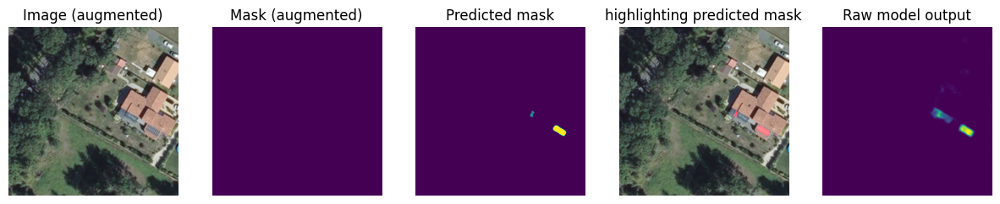

In [21]:
threshold = 0.5
i = 0
predicted_mask = fill_holes_and_remove_small_masks(predicted[i], threshold=threshold)
predicted_mask_colored = get_masks_unet(predicted[i], threshold=threshold)
titles = ["Image (augmented)", "Mask (augmented)", "Predicted mask", "highlighting predicted mask", "Raw model output"]
hg = highlight_mask_on_image(image[i], predicted_mask)
show_images_in_row([image[i], mask[i], predicted_mask_colored, hg, predicted[i]], titles)

In [22]:
calc_precision(predicted[i:i+1], mask[i:i+1], threshold)

(0.0, [0.0, 2.0, 0.0])

Using this threshold we have found 2 extra panel that doesn't exist.

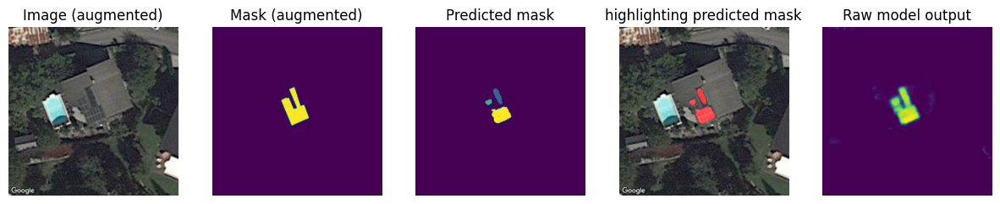

In [23]:
threshold = 0.8
i = 1
predicted_mask = fill_holes_and_remove_small_masks(predicted[i], threshold=threshold)
predicted_mask_colored = get_masks_unet(predicted[i], threshold=threshold)
titles = ["Image (augmented)", "Mask (augmented)", "Predicted mask", "highlighting predicted mask", "Raw model output"]
hg = highlight_mask_on_image(image[i], predicted_mask)
show_images_in_row([image[i], mask[i], predicted_mask_colored, hg, predicted[i]], titles)

In [ ]:
calc_precision(predicted[i:i+1], mask[i:i+1], threshold)

(0.3333322, [1.0, 2.0, 0.0])

Using this threshold we have found 2 extra panel that doesn't exist, and found the one that existed as well.

**Note**

In the second example you might have seen that we segmented the panels, but they weren't considered as True Positives. It's because our task is to "detect and segment" not just "segment" panels. This problem is called under-segmentation.


Over-segmentation and under-segmentation are two common problems that can occur when segmenting images. Over-segmentation occurs when the image is divided into too many segments, while under-segmentation occurs when the image is not divided into enough segments.

Over-segmentation can be caused by a number of factors, including:

* Using a low threshold when segmenting the image.
* Using a segmentation algorithm that is not sensitive to noise.
* Using a segmentation algorithm that is not able to handle small objects.

Under-segmentation can be caused by a number of factors, including:
* Using a high threshold when segmenting the image.
* Using a segmentation algorithm that is not sensitive to edges.
* Using a segmentation algorithm that is not able to handle large objects.

Over-segmentation can make it difficult to identify objects in an image, while under-segmentation can make it difficult to see the boundaries between objects. Both problems can lead to inaccurate results.

To tackle this problem, one can use custom loss functions that will penalize the model for not detecting the edges properly, methods such as weighted map.

## Finding The Best Threshold

We define some functions that will help us find the best threshold for segmentation, using the custom precision we defined earlier.
Let's plot the results of these functions for a batch:

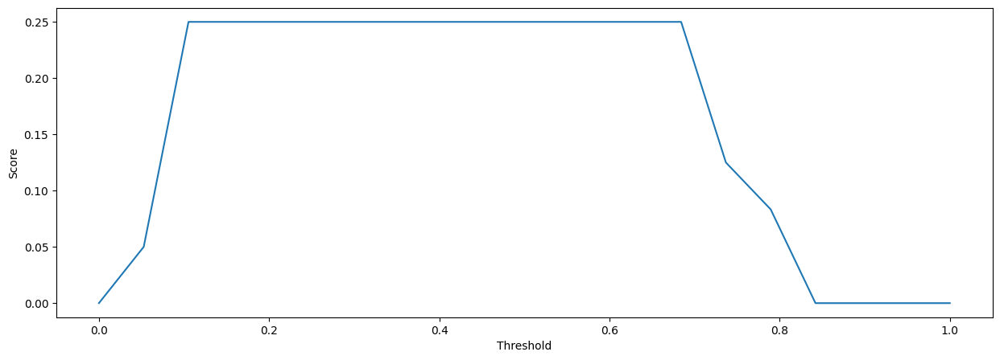

In [24]:
scores, thresholds = find_best_threshold_batch_to_show(predicted, mask)

fig, axs = plt.subplots(1, 1, figsize=(15, 5))
axs.plot(scores, thresholds)
axs.set_xlabel("Threshold")
axs.set_ylabel("Score")
plt.show()

Now on the whole validation dataset:

In [35]:
best_threshold = find_best_threshold(X_val, y_val, unet_model)
best_threshold

  8%|▊         | 13/165 [00:23<04:39,  1.84s/it]/content/gdrive/MyDrive/Proactive ware/utils/utils.py:623: RuntimeWarning: invalid value encountered in float_scalars
  return np.sum(np.array(y_axis_ct) * map_threshold)/np.sum(np.array(y_axis_ct))
100%|██████████| 165/165 [05:21<00:00,  1.95s/it]


0.47734734

**Now we want to calculate scores on our test set using the threshold we just found.**

In [36]:
output_dict = calc_precision_test(
    X_test, 
    y_test, 
    unet_model,
    best_threshold
)

100%|██████████| 1154/1154 [13:31<00:00,  1.42it/s]


In [37]:
print(f"The Average Custom Score is: {output_dict['average_precision_custom']}")
print(f"The Total True Positive is: {output_dict['sum_true_positive']}")
print(f"The Total False Positive is: {output_dict['sum_false_positive']}")
print(f"The Total False Negative is: {output_dict['sum_false_negative']}")

The Average Custom Score is: 0.2574580907821655
The Total True Positive is: 2804.0
The Total False Positive is: 4414.0
The Total False Negative is: 1394.0


In [38]:
recal = output_dict['sum_true_positive'] / (output_dict['sum_true_positive'] + output_dict['sum_false_negative'])
precision = output_dict['sum_true_positive'] / (output_dict['sum_true_positive'] + output_dict['sum_false_positive'])
f1_score = recal * precision

print(f"The Recall is: {recal}")
print(f"The Precision is: {precision}")
print(f"The F1-Score is: {f1_score}")

The Recall is: 0.6679370999336243
The Precision is: 0.3884732723236084
The F1-Score is: 0.2594757080078125


1/1 [==============================] - 0s 35ms/step


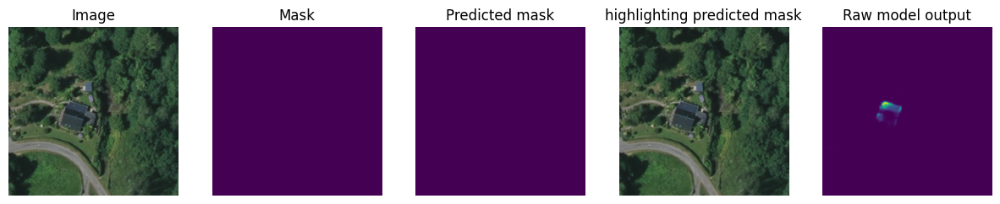

(0.0, [0.0, 0.0, 0.0])
********************


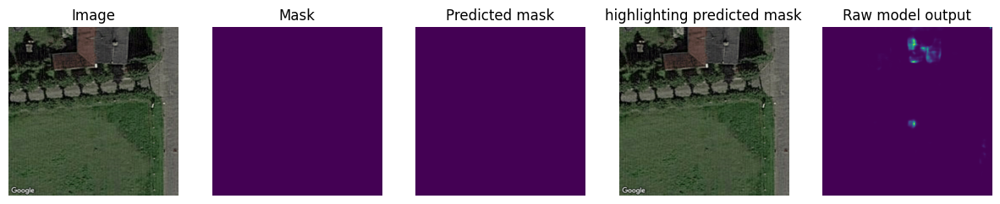

(0.0, [0.0, 0.0, 0.0])
********************


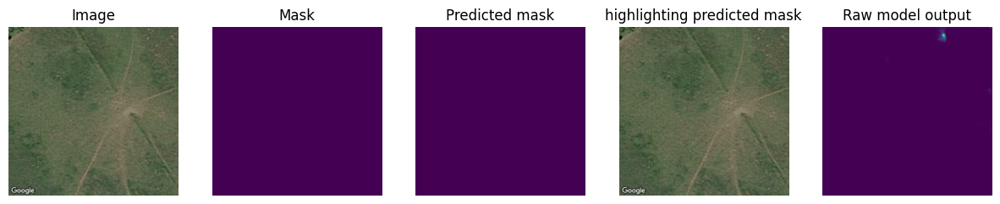

(0.0, [0.0, 0.0, 0.0])
********************


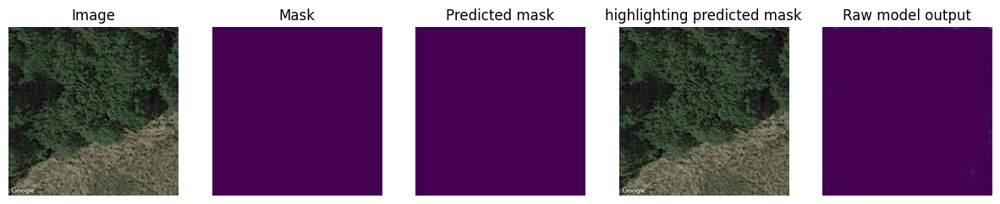

(0.0, [0.0, 0.0, 0.0])
********************


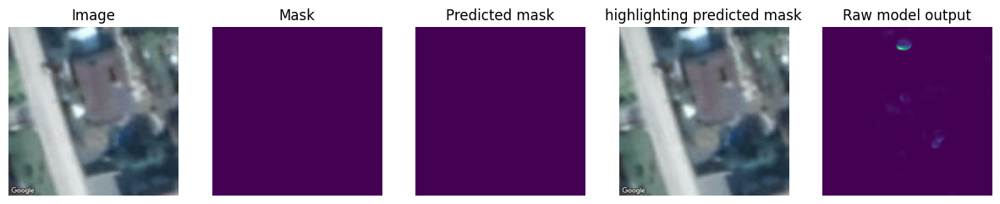

(0.0, [0.0, 0.0, 0.0])
********************


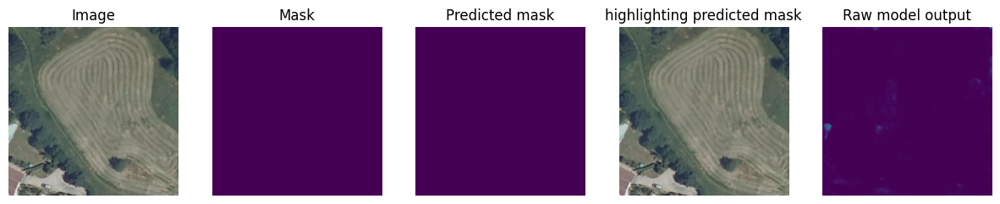

(0.0, [0.0, 0.0, 0.0])
********************


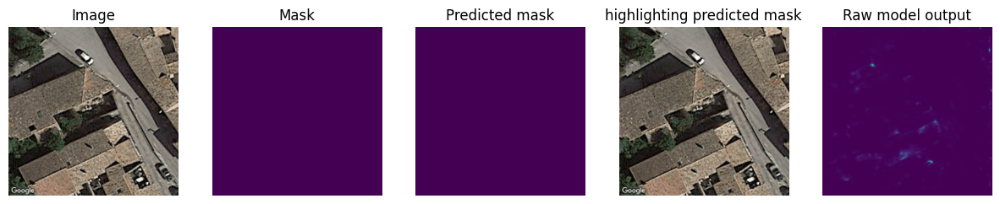

(0.0, [0.0, 0.0, 0.0])
********************


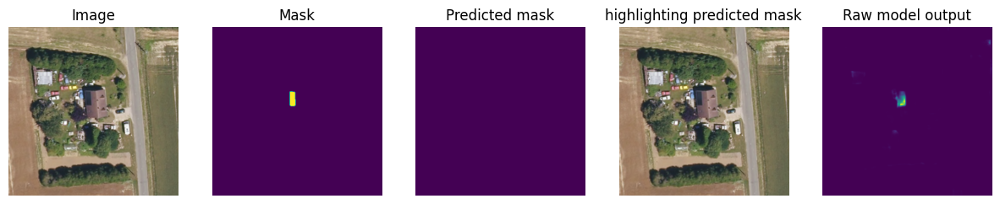

(0.0, [0.0, 0.0, 1.0])
********************


In [39]:
image, mask = output_dict["batch_with_min_precision"]
predicted = unet_model.predict(image)

threshold = best_threshold

for i in range(len(image)):
    predicted_mask = fill_holes_and_remove_small_masks(predicted[i], threshold=threshold)
    predicted_mask_colored = get_masks_unet(predicted[i], threshold=threshold)
    titles = ["Image", "Mask", "Predicted mask", "highlighting predicted mask", "Raw model output"]
    hg = highlight_mask_on_image(image[i], predicted_mask)
    show_images_in_row([image[i], mask[i], predicted_mask_colored, hg, predicted[i]], titles)
    plt.show()
    print(calc_precision(predicted[i:i+1], mask[i:i+1], threshold))
    print("*" * 20)

**Notes**

By looking at this batch, We can think of some notes:
* Almost in every example, there is no panel. which means that the function will return custom precision score of 0, No matter what. 
* In the last example, The model found the panel but couldn't segment the panel with an IOU of 0.5

Lets run a test on the images that at least contain a panel.

In [47]:
output_dict = calc_precision_test(
    X_test_with_mask, 
    y_test_with_mask, 
    unet_model,
    best_threshold
)

100%|██████████| 525/525 [06:41<00:00,  1.31it/s]


In [48]:
print(f"The Average Custom Score is: {output_dict['average_precision_custom']}")
print(f"The Total True Positive is: {output_dict['sum_true_positive']}")
print(f"The Total False Positive is: {output_dict['sum_false_positive']}")
print(f"The Total False Negative is: {output_dict['sum_false_negative']}")

The Average Custom Score is: 0.5659173727035522
The Total True Positive is: 2804.0
The Total False Positive is: 3060.0
The Total False Negative is: 1394.0


In [49]:
recal = output_dict['sum_true_positive'] / (output_dict['sum_true_positive'] + output_dict['sum_false_negative'])
precision = output_dict['sum_true_positive'] / (output_dict['sum_true_positive'] + output_dict['sum_false_positive'])
f1_score = recal * precision

print(f"The Recall is: {recal}")
print(f"The Precision is: {precision}")
print(f"The F1-Score is: {f1_score}")

The Recall is: 0.6679370999336243
The Precision is: 0.4781718850135803
The F1-Score is: 0.319388747215271


1/1 [==============================] - 0s 42ms/step


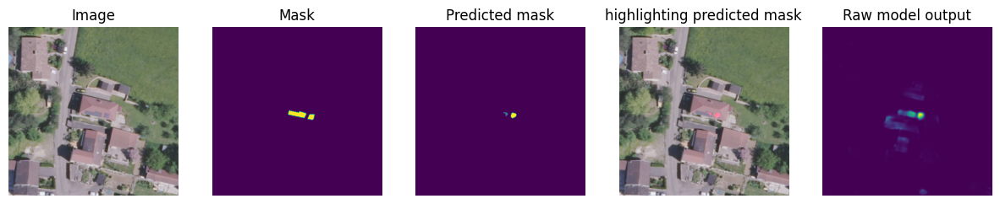

(0.0, [0.0, 2.0, 1.0])
********************


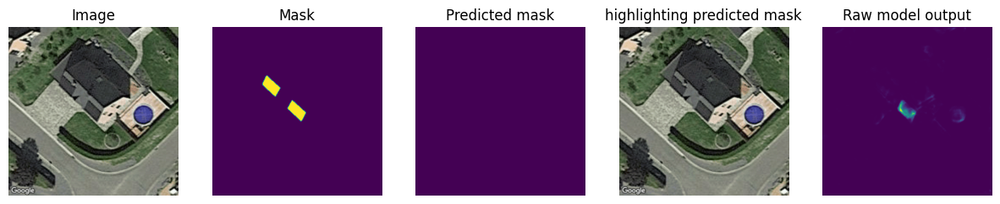

(0.0, [0.0, 0.0, 1.0])
********************


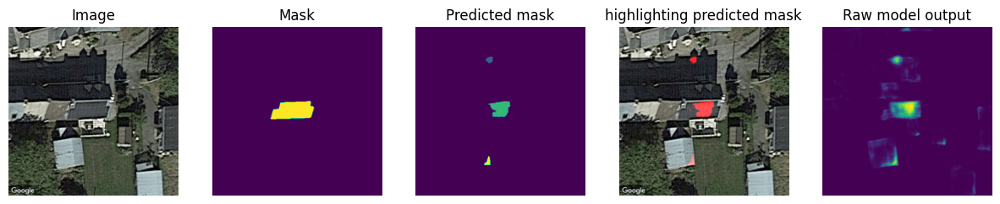

(0.0, [0.0, 3.0, 1.0])
********************


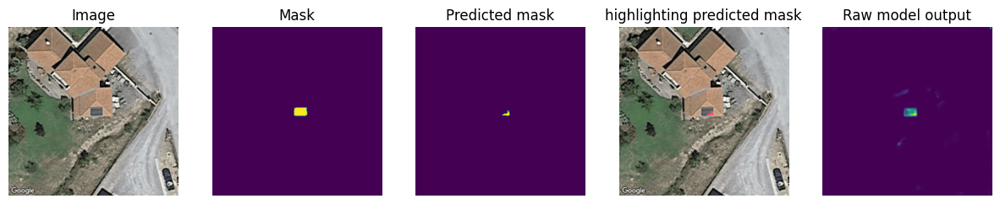

(0.0, [0.0, 1.0, 1.0])
********************


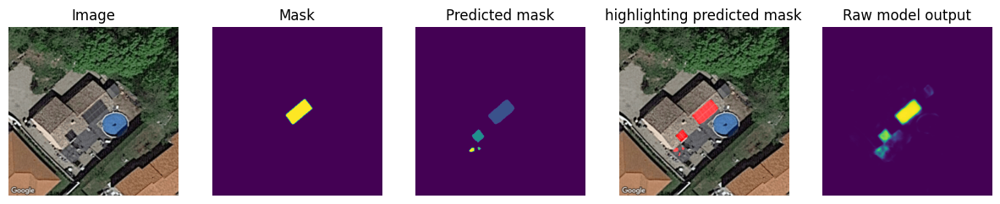

(0.24999937, [1.0, 3.0, 0.0])
********************


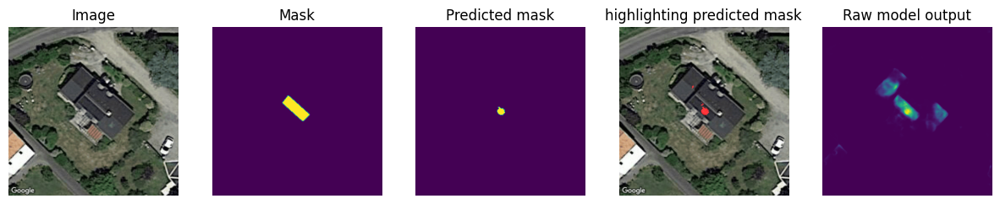

(0.0, [0.0, 1.0, 1.0])
********************


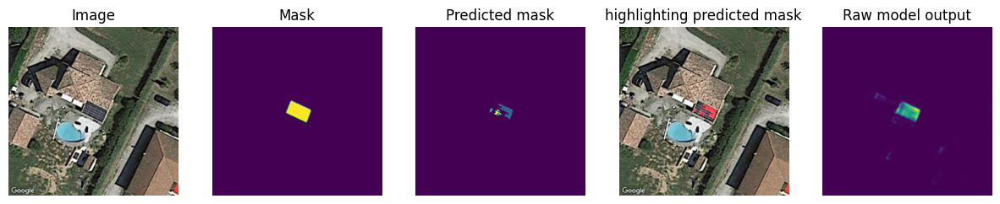

(0.0, [0.0, 3.0, 1.0])
********************


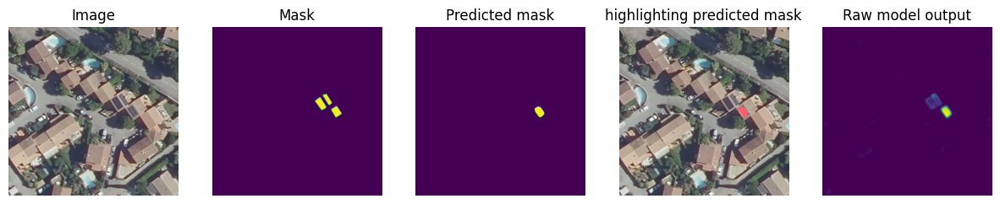

(0.0, [0.0, 1.0, 1.0])
********************


In [50]:
image, mask = output_dict["batch_with_min_precision"]
predicted = unet_model.predict(image)

threshold = best_threshold

for i in range(len(image)):
    predicted_mask = fill_holes_and_remove_small_masks(predicted[i], threshold=threshold)
    predicted_mask_colored = get_masks_unet(predicted[i], threshold=threshold)
    titles = ["Image", "Mask", "Predicted mask", "highlighting predicted mask", "Raw model output"]
    hg = highlight_mask_on_image(image[i], predicted_mask)
    show_images_in_row([image[i], mask[i], predicted_mask_colored, hg, predicted[i]], titles)
    plt.show()
    print(calc_precision(predicted[i:i+1], mask[i:i+1], threshold))
    print("*" * 20)

# Conclusions
By looking at this batch, We can think of some notes:
* In the first and last examples the panels were very small and they didn't have a very dark color, barely visible for humans.
* In the5th example, There are some objects (like shadows) that look like a panel, hardly distinguishable for humans.
* In the rest of the examples, The model found panels but couldn't segment the panels with an IOU of 0.5

We don't have a baseline score (such as human's performance) to compare with, and these erros looks like they can be of type "irreducable errors". and besides that, the custom score doesn't tell any thing, because it will return 0 for input images that contain no panels. It was just a relative score we defined to find the proper threshold. The Only Scores we can interpret are recall, precision and F-1 scores.

To improve the results We can increase the input size of the model, Doing so might requires a computer with higher memory capacity.